# YOLOv8

## 0. Importing libraries

import necessary libraries and modules and sets environment variables.

* Importing Libraries:
   - `os` module provides a way to interact with the operating system.
   - `PIL` (Python Imaging Library) provides image processing capabilities.
   - `ast` module is used for parsing Python literal structures.
   - `torch` is a popular machine learning library.
   - `tensorboard` is used for visualization and monitoring of training models.
   - `PIL.Image` is a module within PIL for working with images.
   - `glob` is used for file pattern matching.
   - `Path` from `pathlib` provides an object-oriented interface to filesystem paths.
   - `numpy` is a library for numerical operations.
   - `pandas` is used for data manipulation and analysis.
   - `IPython.display` allows for displaying images and other media types in IPython.

* Setting Environment Variables:
   - `os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'` sets the minimum log level for TensorFlow to 2, which silences TensorFlow warnings.

The code snippet is preparing the environment and importing required libraries for further operations. It sets up the necessary dependencies and configurations to ensure smooth execution of subsequent code.


In [33]:
import yaml
import os
import random
from glob import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt
import PIL
from PIL import ImageDraw
from IPython.display import Image, display# clear_output
from utils import getBounds, getHeight, getWidth

import os
os.environ['WANDB_DISABLED'] = 'true'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # silence tf warnings

## 1. Data preprocessing

visualize the annotated bounding boxes on a random selection of three images from your dataset, helping you verify the correctness of the annotations before training your model.

1. It then specifies the path to the YAML file containing the dataset configuration, `dataset.yaml`. This file contains information about the paths to the training images and their corresponding label files.

2. The code loads the dataset configuration from the YAML file using the `yaml.safe_load()` function. This configuration is stored in the dataset_config variable.

3. Next, it extracts the paths to the training images and the corresponding label files from the dataset configuration.

4. The code retrieves a list of image files in the training path using `os.listdir()`. These files represent the images that will be randomly selected for annotation visualization.

5. It randomly selects three images from the list of image files using the `random.sample()` function.

6. The code then iterates over the randomly selected image files.

7. For each image file, it loads the image using the `Image.open()` function from the `PIL` library. This allows the code to work with the image and apply annotations.

8. The corresponding label file path is determined by replacing the "*images*" directory with "*labels*" in the image file path.

9. The bounding box coordinates are read from the label file using the `open()` function and `readlines()` method. These coordinates represent the location and size of the objects of interest in the image.

10. The bounding box coordinates are prepared for plotting by converting them from normalized values to pixel coordinates based on the image size.

11. The code uses the `ImageDraw.Draw()` function from `PIL` to draw bounding boxes on the image. It iterates over the bounding box coordinates and draws a rectangle for each bounding box.

12. Finally, the annotated image is displayed using `display()` from `IPython.display`. The image will be shown with the bounding boxes in the output of the code cell when executed in an IPython environment.

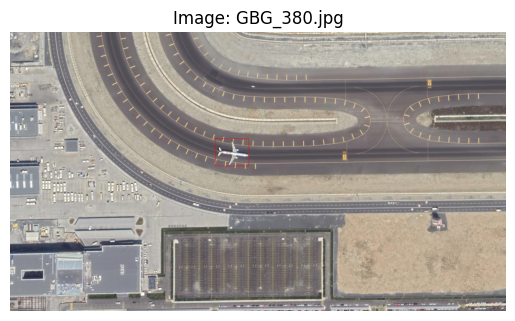

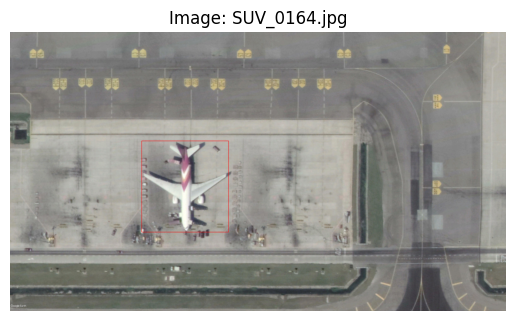

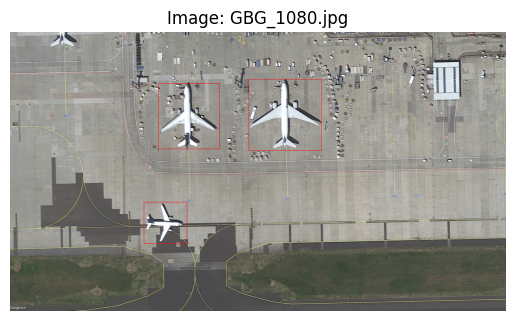

In [6]:
# Specify the path to the YAML file
yaml_file_path = './data/HRPlanesv2/dataset.yaml'

# Load the YAML file
with open(yaml_file_path, 'r') as f:
    dataset_config = yaml.safe_load(f)

# Get the train and labels paths from the dataset configuration
train_path = dataset_config['train']
labels_path = dataset_config['train'].replace('images', 'labels')

# Get a list of image files in the train path
image_files = os.listdir(train_path)

# Randomly select 3 images
random_images = random.sample(image_files, 3)

# Iterate over the randomly selected images
for image_file in random_images:
    # Load the image
    image_path = os.path.join(train_path, image_file)
    image = PIL.Image.open(image_path)

    # Load the corresponding label file
    label_file = os.path.splitext(image_file)[0] + '.txt'
    label_path = os.path.join(labels_path, label_file)

    # Read the bounding box coordinates from the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Prepare the bounding box coordinates for plotting
    bboxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        xmin = int((x_center - width / 2) * image.width)
        ymin = int((y_center - height / 2) * image.height)
        xmax = int((x_center + width / 2) * image.width)
        ymax = int((y_center + height / 2) * image.height)
        bboxes.append((xmin, ymin, xmax, ymax))

    # Draw bounding boxes on the image
    draw = ImageDraw.Draw(image)
    for bbox in bboxes:
        draw.rectangle(bbox, outline='red', width=4)

    # Plot the image with bounding boxes
    plt.imshow(image)
    plt.title(f'Image: {image_file}')
    plt.axis('off')
    plt.show()


## 2. Training
To train the YOLOv8 network we need to import it and specify the required parameters.
Parameters:  
 - model:      the default model .yaml config file or the .pt model (if using a pretrained model)
 - data:       the localisation of the dataset.yaml we defined earlier
 - imgsz:      the image size, here our 512x tiles
 - project:    where the training experiments data will be saved (here under the ./runs/train/ subfolder in the current directory)
 - batch-size: useful on larger datasets
 - epochs:     training steps

In [ ]:
DATAPATH = "./data/HRPlanesv2/dataset.yaml"
PROJECT_NAME = "expv8-200"

# Training froms sratch a new model, v8x is the largest architecture
model = YOLO(model = "yolov8x.yaml") 
# Training for 3 epochs to check
model.train(data = DATAPATH, imgsz=512, project = PROJECT_NAME, epochs = 3, batch = 16)


                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics.nn.modules.conv.Conv             [640

AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅
train: Scanning /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/train/labels.cache.
val: Scanning /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/val/labels.cache... 4
Plotting labels to expv8/train3/labels.jpg... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to expv8/train3
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
        1/3      11.1G      3.214       2.54      2.904         13        512: 100%|████████
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10
                   all        420       2555       0.22      0.205     0.0964     0.0329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances  

## Evaluation on unseen images: 

**Replace** `MODEL_PATH` with the value of your latest trained weights.

In [ ]:
MODEL_PATH = "expv8-200/train4/weights/best.pt"

trained_model = YOLO(model=MODEL_PATH)
results = trained_model(source="./data/HRPlanesv2/unseen/", imgsz = 1024, conf = 0.1, save = True,
                        save_txt = True, save_conf = True, project = "./runs/detect/")  # predict on unseen images

Prediction visualization

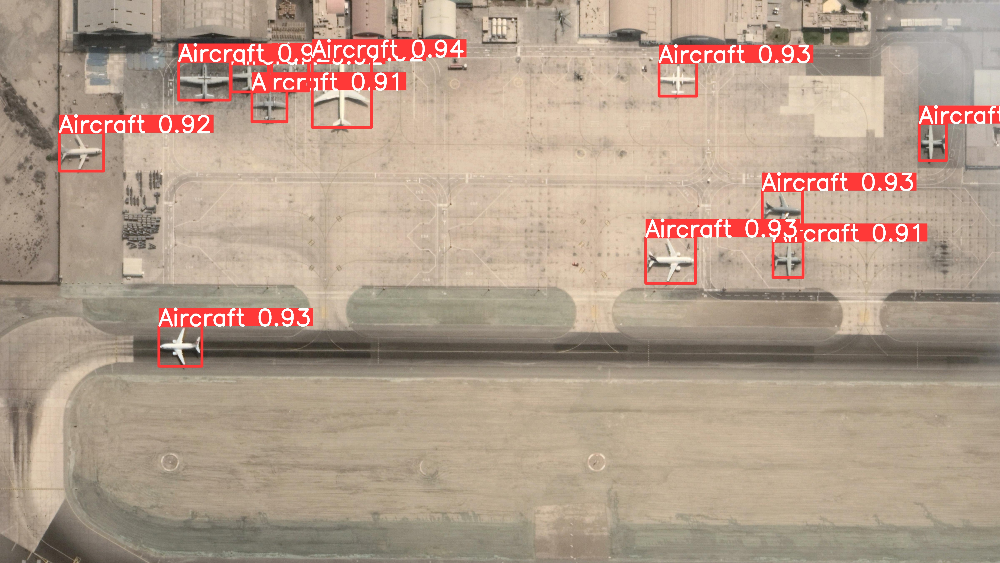

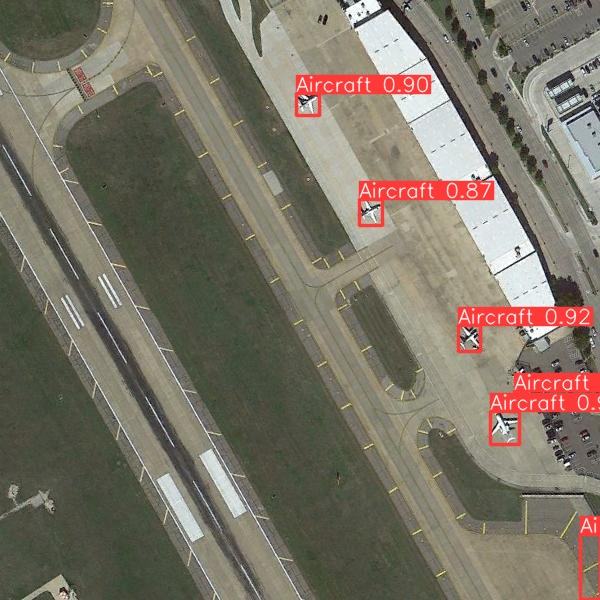

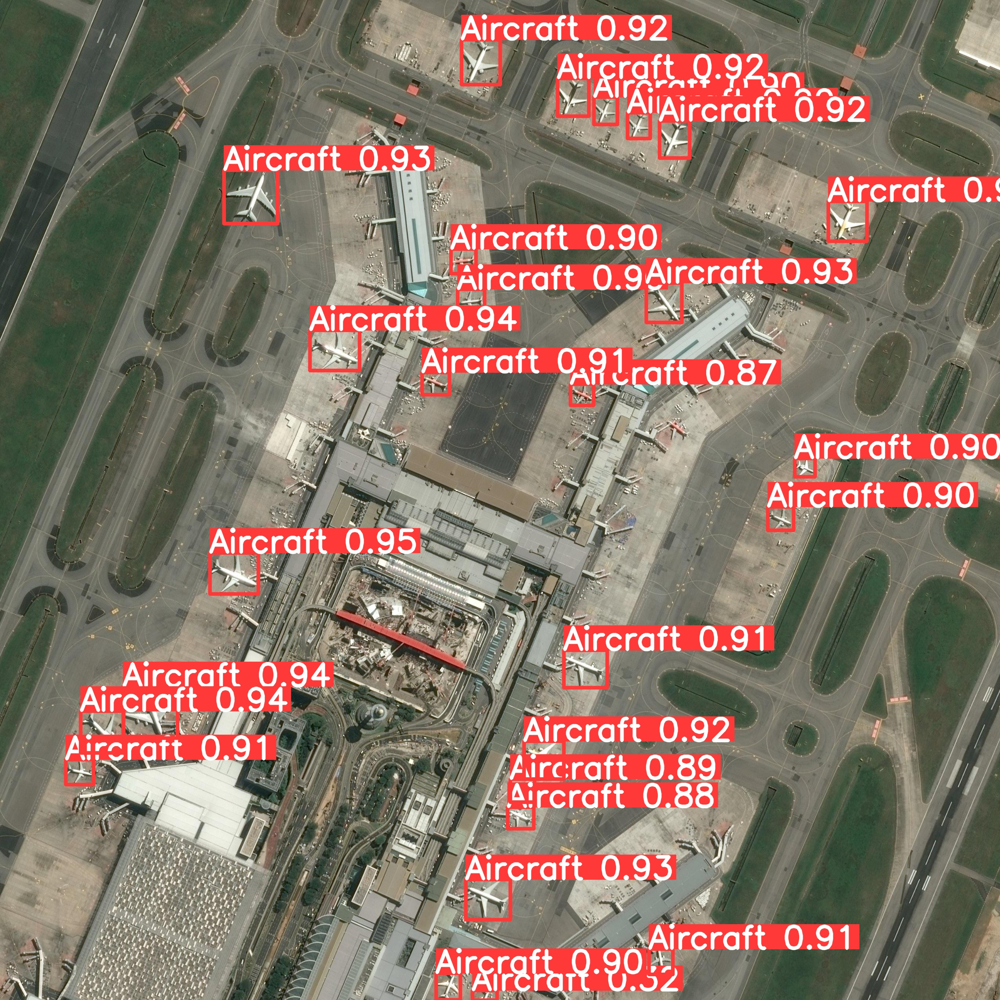

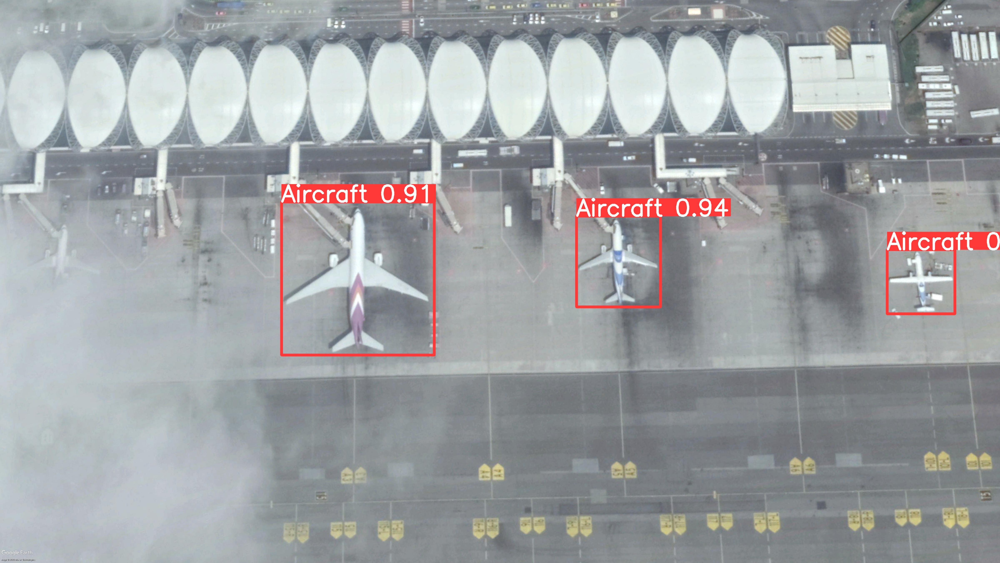

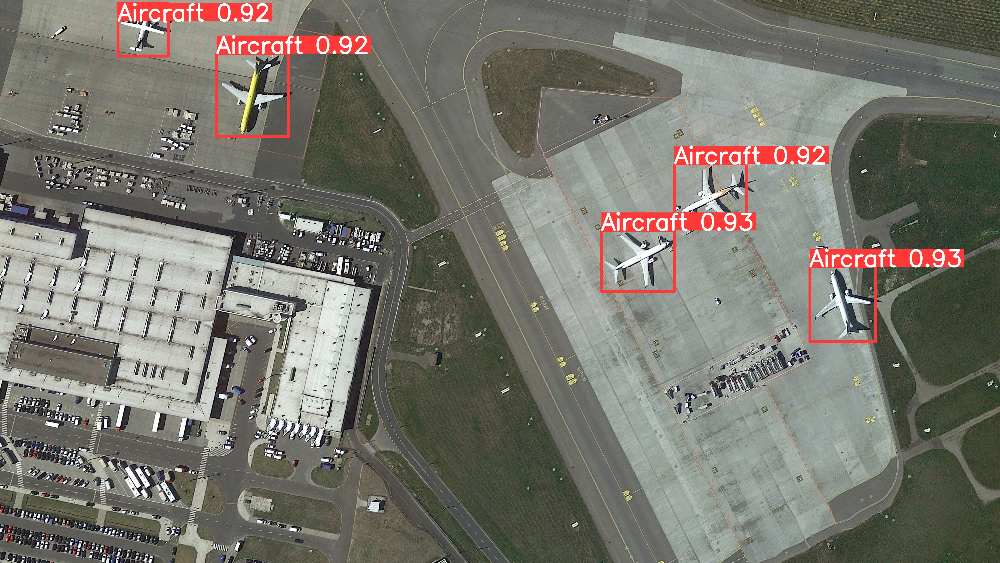

In [34]:
for image_path in glob('./runs/detect/predict/*.jpg')[:5]:
      display(Image(image_path, width = 256))

## 3. Training on HRPlanesv2

In [3]:
datapath = "./data/HRPlanesv2/dataset.yaml"

model = YOLO(model = "yolov8x.yaml") # Training froms sratch a new model, v8x is the largest

WARNING ⚠️ Ultralytics settings reset to default values. This may be due to a possible problem with your settings or a recent ultralytics package update. 
View settings with 'yolo settings' or at '/home/arnaud/.config/Ultralytics/settings.yaml'
Update settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'.

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320,

In [4]:
model.train(data = datapath, imgsz=512, project = "expv8-200", epochs = 200, batch = 16, device=2)

Ultralytics YOLOv8.0.213 🚀 Python-3.9.18 torch-2.1.1+cu121 CUDA:2 (NVIDIA RTX A6000, 48674MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.yaml, data=./data/HRPlanesv2/dataset.yaml, epochs=200, patience=50, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=2, workers=8, project=expv8-200, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, 

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/train/labels... 1490 images, 0 backgro


train: New cache created: /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/train/labels.cache


val: Scanning /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/val/labels... 420 images, 0 backgrounds,

val: New cache created: /home/arnaud/projects/benchmark_aircraft/data/HRPlanesv2/val/labels.cache


Plotting labels to expv8-200/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to expv8-200/train4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      8.69G      3.259      2.556      2.911         13        512: 100%|██████████| 94/94 [00:28<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.271      0.238      0.159     0.0541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      9.19G      1.919      1.275      1.634         19        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.74       0.63      0.698       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      8.94G      1.714      1.014      1.375         15        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.817      0.699      0.777       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      8.89G      1.551     0.8849      1.272         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.895      0.802      0.891      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200         9G      1.395     0.7899      1.176         30        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.859      0.801      0.841      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      8.89G      1.313     0.7242      1.135         34        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.93      0.841      0.917      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      9.16G      1.291     0.6868       1.12         26        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.937      0.835      0.915      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200       8.9G      1.166     0.6244      1.067         31        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.92      0.865      0.924        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200       8.9G      1.136     0.6078      1.051         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.936       0.89      0.942      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      9.25G      1.093     0.5791      1.033         29        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.95      0.871      0.938      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      9.01G      1.072      0.569      1.024          7        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.936      0.899      0.947      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      8.89G      1.036      0.537      1.013         35        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.943      0.922      0.949       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200       8.9G      1.023     0.5318      1.005         46        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.932      0.891      0.922       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      8.89G      1.005     0.5277      1.001         10        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.959      0.918      0.959      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200       8.9G     0.9868     0.5066     0.9903         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.959      0.921       0.96       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      8.89G     0.9668     0.4971     0.9848        101        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.959      0.916       0.96      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      8.91G     0.9672     0.5011     0.9808         43        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.964      0.913      0.957      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200       8.9G     0.9236     0.4771     0.9666          6        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.954      0.925      0.961      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      8.91G     0.9389     0.4762     0.9644         24        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.962       0.94      0.967      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      8.89G     0.9246     0.4669     0.9665          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.961      0.926      0.966      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200       8.9G     0.9043     0.4531     0.9636          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.971      0.938       0.97      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      8.89G     0.9022     0.4591     0.9665         22        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.967      0.919      0.967      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      8.91G      0.904     0.4508     0.9482          5        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.962      0.934      0.967      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      8.89G     0.8734     0.4414     0.9546         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.966      0.933      0.968      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      8.92G     0.8841      0.446     0.9517         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.968      0.929       0.97      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      8.89G     0.8815     0.4335     0.9409         19        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.969      0.937      0.969      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      9.03G     0.8755     0.4294      0.953         20        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.969      0.946       0.97      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      8.89G     0.8678     0.4269     0.9427         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.967      0.934      0.972       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200       8.9G     0.8371     0.4204     0.9398         10        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.964      0.953      0.975      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      8.89G     0.8365      0.416     0.9328          8        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.967      0.936      0.976      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200       8.9G     0.8348     0.4102     0.9406         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.956      0.941      0.973      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      8.89G      0.859     0.4191     0.9411         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.974      0.949      0.974      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200       8.9G      0.822     0.4016     0.9231         24        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.969      0.949      0.977      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      8.89G     0.8222     0.4034      0.929         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.967      0.949      0.979      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      8.91G     0.8092     0.3991     0.9282         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.96      0.953       0.98      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      8.89G     0.8135     0.4022     0.9282          8        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.963      0.939      0.973      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200       8.9G      0.806     0.3967     0.9168         13        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.958       0.93      0.969      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      8.89G     0.7994     0.3917     0.9219         24        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.963      0.961      0.982      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      8.91G     0.7856     0.3864     0.9194         30        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.971      0.958      0.982      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200       8.9G     0.7829     0.3796     0.9141         28        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.964      0.956      0.982       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      8.92G     0.7904     0.3863     0.9119         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.972      0.956      0.986      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      8.89G      0.791     0.3853     0.9215         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.964      0.955       0.98      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      8.91G      0.778     0.3776     0.9102         23        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.951      0.987      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      8.88G     0.7715     0.3756     0.9191         22        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.968      0.954      0.985      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      9.02G     0.7775     0.3774     0.9218          4        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.949      0.982      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      8.96G     0.7737     0.3773     0.9114         16        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.976      0.959      0.983      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      8.91G      0.759     0.3717     0.9098         16        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.955      0.986       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      8.89G     0.7787     0.3722     0.9109         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.97      0.957      0.982      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200       8.9G     0.7602     0.3688     0.9064         27        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.967      0.966      0.987      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      8.89G      0.746      0.364     0.9046         61        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.951      0.984      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200       8.9G     0.7581      0.368     0.9095         13        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.955      0.987      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      8.88G     0.7474     0.3616     0.9084         48        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.97      0.957      0.984      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200       8.9G     0.7487     0.3624     0.9044         35        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.974      0.966      0.988      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      8.89G     0.7433     0.3551     0.8988         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.969      0.989      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200       8.9G     0.7381     0.3565     0.8976         13        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.971      0.955      0.985      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      8.88G     0.7429     0.3591     0.9015          7        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.974      0.962      0.985      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200       8.9G     0.7325     0.3575      0.905        146        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.976      0.959      0.986      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      8.89G     0.7193     0.3496     0.8973         10        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.969      0.965      0.988      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200       8.9G       0.73     0.3513     0.8964         48        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.976      0.962      0.989      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      8.89G     0.7383     0.3526     0.8987         63        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.973      0.965      0.986       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200       8.9G     0.7172     0.3439     0.8972         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.966      0.988      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      8.89G     0.7173     0.3458     0.8909         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.965      0.987      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      8.92G     0.7229     0.3489     0.8933         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.974       0.97      0.989      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      8.89G     0.7111     0.3404     0.8912         24        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.963      0.989      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200       8.9G     0.7066     0.3368     0.8876         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.974      0.965      0.985      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      8.89G     0.7035     0.3383     0.8889         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.972      0.963      0.985      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      8.89G      0.716     0.3453     0.8904         80        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.98      0.955      0.988      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      9.01G     0.6907     0.3352     0.8842         37        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.975      0.963      0.988      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      8.89G     0.7093     0.3471     0.8944         61        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.976      0.969      0.987      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      8.88G     0.6938     0.3342     0.8896         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.968      0.988      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      8.92G     0.7076     0.3394     0.8887         32        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.966      0.989      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      8.88G     0.6907     0.3365     0.8855         17        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.954      0.984      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      8.91G     0.6872     0.3325     0.8869         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.973      0.989      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      8.88G     0.6999     0.3328     0.8899         11        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.975      0.958      0.984      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      8.91G     0.6806     0.3322      0.884         18        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.968      0.991      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      8.88G     0.6891     0.3334      0.879         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.973      0.974       0.99      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      8.92G     0.6774     0.3274     0.8797         18        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.968       0.99      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      8.89G     0.6721     0.3326     0.8819          4        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.972      0.991      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      9.16G     0.6681     0.3239     0.8805          9        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.97      0.978       0.99      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      8.97G     0.6655     0.3229      0.875         10        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.979      0.971       0.99      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200       8.9G     0.6676     0.3244     0.8773         81        512: 100%|██████████| 94/94 [00:26<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.969       0.99      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      8.89G     0.6628     0.3166     0.8765         21        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.979      0.967      0.991      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      8.91G     0.6589      0.317     0.8791         27        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.972      0.975      0.991       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      8.89G     0.6433     0.3104     0.8735         25        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.99      0.962      0.989       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200       8.9G     0.6567      0.319     0.8759         28        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.974      0.992      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      8.89G      0.663     0.3185     0.8763          8        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.965       0.99      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200       8.9G     0.6545      0.314     0.8732          6        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.961      0.989      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      8.89G     0.6389     0.3081     0.8699         10        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.966      0.989      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200       8.9G     0.6456     0.3117     0.8793         19        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.963      0.989      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      8.89G     0.6539     0.3131     0.8703         16        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.973       0.99      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      8.91G     0.6495     0.3105     0.8809          5        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.979      0.962      0.987      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      8.89G     0.6474      0.311     0.8782          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.969       0.99      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200       8.9G     0.6462     0.3136      0.875         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.973      0.992       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200         9G     0.6432     0.3088     0.8677         31        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.975      0.969      0.989      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200       8.9G     0.6436     0.3088     0.8678         28        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.968      0.988      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      8.89G     0.6268     0.3038     0.8647         34        512: 100%|██████████| 94/94 [00:22<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.966      0.992      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      8.91G     0.6411     0.3089     0.8682         62        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.971       0.99       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      8.89G     0.6295     0.3032     0.8678         49        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.972      0.977      0.991      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      8.91G     0.6294     0.2996     0.8648         20        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.975      0.991      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      8.89G      0.643     0.3073     0.8674         20        512: 100%|██████████| 94/94 [00:22<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.972      0.992      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200       8.9G     0.6126     0.2971     0.8646         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.972      0.992      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      8.89G     0.6257     0.3012     0.8659         28        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.971      0.991      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200       8.9G     0.6241     0.2982     0.8683          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.968      0.991      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      8.89G      0.611     0.2975     0.8641         22        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.971      0.992      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      8.91G     0.6342     0.3019     0.8696         10        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.977      0.974      0.988      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      8.89G     0.6168     0.2937     0.8647          6        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.965      0.991      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200       8.9G     0.6156     0.2936     0.8658         22        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.972      0.992      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      8.89G     0.6169     0.2959     0.8653         60        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.989      0.969      0.991      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200       8.9G     0.6238     0.3023     0.8653          9        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981       0.98      0.992      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      8.89G      0.609     0.2933     0.8615          9        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.977      0.992      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      8.91G      0.594      0.289     0.8582         29        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.974      0.991      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      8.89G     0.6018     0.2879     0.8604         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.973      0.991      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      8.91G     0.6074     0.2915     0.8625          7        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.962      0.989      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      8.89G     0.6054     0.2937     0.8587         13        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.969      0.991      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200       8.9G     0.5958     0.2867     0.8536         20        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.971       0.99      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      8.89G     0.6011     0.2909     0.8638         21        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.976      0.991      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      8.89G     0.5887     0.2855     0.8567         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.991      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      8.88G     0.5968     0.2872     0.8595         34        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.978      0.992      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      8.91G     0.5995     0.2875     0.8627         35        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.974      0.991        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      8.89G     0.5779     0.2788     0.8553         14        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.978      0.974      0.991      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      8.91G     0.5939     0.2865     0.8587         21        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.975       0.99      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      8.89G     0.5742     0.2767      0.855         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.976      0.977      0.991      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      8.91G     0.5765     0.2762     0.8591         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.974      0.991      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      8.89G     0.5855      0.283      0.856         16        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.969      0.991      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200       8.9G     0.5837     0.2802     0.8566         20        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.972      0.992      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      8.89G     0.5863     0.2825     0.8571         19        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985       0.97      0.991      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      8.89G     0.5749     0.2779     0.8482         30        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.972      0.992        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      8.88G     0.5707     0.2763     0.8482         19        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.974      0.992      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200       8.9G      0.574     0.2741     0.8462         57        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.992      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      8.88G     0.5745     0.2748     0.8537         38        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.975      0.991      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      8.91G     0.5676     0.2754     0.8519         54        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.971       0.99        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      8.89G     0.5738     0.2754     0.8483         16        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.979      0.991      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200       8.9G      0.565     0.2703     0.8509         22        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.976      0.991      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      8.89G     0.5689     0.2737     0.8519          6        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1


                   all        420       2555      0.979      0.979      0.991      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      8.91G     0.5654     0.2743     0.8488         36        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.976       0.99      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200         9G     0.5559     0.2673      0.848         21        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.973      0.992      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      8.91G     0.5541      0.266     0.8527         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.992      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      8.89G     0.5641     0.2715     0.8485         18        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.973      0.991      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      8.92G     0.5537     0.2674     0.8474         35        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.974      0.991       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      9.01G      0.563     0.2699     0.8459         28        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.973      0.992      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      8.91G     0.5556     0.2661      0.852         23        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.972      0.991      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      8.89G     0.5393      0.261     0.8455         22        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.981      0.978      0.992      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200       8.9G     0.5556     0.2656     0.8491          4        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.975      0.991      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      8.88G     0.5535     0.2666     0.8445         27        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.98      0.979      0.992      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200       8.9G     0.5484     0.2627     0.8467          5        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.992      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      8.89G     0.5403     0.2594     0.8429         20        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.976      0.992       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200       8.9G     0.5373     0.2602     0.8447         30        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.973       0.99      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      8.89G     0.5404     0.2618     0.8473         15        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.971      0.991       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200       8.9G     0.5409     0.2604     0.8438         18        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.972      0.992      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      8.88G     0.5416     0.2635     0.8429         11        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.974      0.991      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      8.91G     0.5283     0.2555     0.8409         10        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.975      0.991      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200         9G     0.5363     0.2583     0.8439         10        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.977      0.992      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      8.92G     0.5321     0.2587     0.8426         11        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.975      0.993      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      8.89G     0.5274     0.2548     0.8401          9        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.989      0.978      0.993      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200         9G     0.5237     0.2543     0.8419         37        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.975      0.992      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      8.88G     0.5383     0.2589     0.8445          8        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.976      0.991      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      8.91G     0.5272     0.2548     0.8417         17        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.976      0.992      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      8.88G     0.5177     0.2543     0.8385          9        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.988      0.973      0.992      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      8.91G     0.5186     0.2517     0.8384         34        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.975      0.992      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      8.89G      0.519     0.2501     0.8359         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.992      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      8.89G     0.5182     0.2506     0.8388         30        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.992      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      8.89G     0.5119     0.2503     0.8354         36        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.976      0.992      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200       8.9G     0.5166     0.2514     0.8403         22        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.979      0.992      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      8.89G     0.5245     0.2546      0.839         25        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.977      0.992      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200       8.9G     0.5049     0.2455     0.8346         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.977      0.991      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      8.89G      0.509     0.2464     0.8343         23        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.978      0.992       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200       8.9G     0.5096     0.2478     0.8383         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.976       0.99      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      8.89G     0.5037     0.2446     0.8332         24        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555       0.99      0.972      0.991       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200       8.9G     0.4999     0.2467     0.8381         24        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.975      0.992       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      8.88G     0.5048     0.2461     0.8325         21        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.974       0.99      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      8.91G      0.499     0.2426     0.8309         32        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.982      0.976      0.991      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      8.88G     0.5067     0.2448     0.8343         14        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.991      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200       8.9G     0.4996     0.2417     0.8312         29        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973       0.99      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      8.89G     0.4985     0.2412      0.834         20        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.991      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      8.91G     0.4959     0.2422     0.8329         31        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.975      0.992      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      8.88G     0.4863     0.2374     0.8303         16        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.975      0.992      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      8.91G     0.4883     0.2391      0.833         26        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.991      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      8.88G     0.4859     0.2352     0.8272         24        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.974      0.991      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200       8.9G     0.4897     0.2391     0.8304         10        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.975       0.99      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      8.89G     0.4913     0.2378      0.833          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.977      0.992      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      9.02G     0.4883     0.2416     0.8357          5        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.992      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      8.89G     0.4775     0.2333      0.832         26        512: 100%|██████████| 94/94 [00:25<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.976      0.991      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200       8.9G     0.4831     0.2354     0.8328         20        512: 100%|██████████| 94/94 [00:23<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.992      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      8.89G      0.479     0.2316      0.832         14        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973      0.991      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200       8.9G     0.4891     0.2377     0.8302         44        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.974      0.992       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200         9G     0.4789     0.2332     0.8293         77        512: 100%|██████████| 94/94 [00:22<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.984      0.975       0.99      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      8.89G     0.4715     0.2301     0.8294         36        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.974       0.99      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      8.68G      0.479     0.2344     0.8288         51        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.975      0.991      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      8.91G     0.4791     0.2354     0.8307         47        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.976      0.991      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      8.88G     0.4751     0.2332     0.8246         23        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.975      0.991      0.813


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200       8.9G     0.4657     0.2211     0.8174         13        512: 100%|██████████| 94/94 [00:30<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.971       0.99       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      8.88G     0.4533     0.2155     0.8138         48        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.983      0.973       0.99       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      9.28G     0.4388     0.2123     0.8127         17        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.974       0.99      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      8.88G     0.4415      0.211     0.8164          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.974       0.99      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200       8.9G     0.4404     0.2092     0.8141         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.986      0.973       0.99      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      8.89G     0.4319     0.2071     0.8132         15        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.985      0.975      0.991      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      8.89G     0.4352     0.2102     0.8115          8        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.974      0.991      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      8.89G     0.4282     0.2057      0.814         12        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.973      0.991      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      8.91G      0.421     0.2043     0.8116         26        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.973      0.991      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      8.99G     0.4258     0.2032     0.8094          3        512: 100%|██████████| 94/94 [00:24<00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1

                   all        420       2555      0.987      0.974      0.991      0.837



200 epochs completed in 1.644 hours.
Optimizer stripped from expv8-200/train4/weights/last.pt, 136.7MB
Optimizer stripped from expv8-200/train4/weights/best.pt, 136.7MB

Validating expv8-200/train4/weights/best.pt...
Ultralytics YOLOv8.0.213 🚀 Python-3.9.18 torch-2.1.1+cu121 CUDA:2 (NVIDIA RTX A6000, 48674MiB)
YOLOv8x summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/1


                   all        420       2555      0.987      0.974      0.991      0.837
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to expv8-200/train4


lr/pg0,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▆▇▇▇▇██████████████████████████████████
metrics/mAP50-95(B),▁▄▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇██▇████████████
metrics/precision(B),▁▆▇▇▇▇█▇▇█▇█████████████████████████████
metrics/recall(B),▁▅▇▇▇▇▇▇████████████████████████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ff9b4344c10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

**Saved in expv8-200/train4**  

tensorboard --logdir expv8-200/train4

## 500 epochs training

Benchmark

We use the [CLI](https://docs.ultralytics.com/modes/train/#__tabbed_1_2) for better training logging.

In [3]:
datapath = "./data/HRPlanesv2/dataset.yaml"
project_name = "expv8-200"

Warning: long command. Using nohup to keep progress if disconnected.

In [4]:
!nohup yolo detect train data=$datapath model=yolov8x.yaml epochs=500 imgsz=512 project=$project_name device=1,2 > logv8_500_2.out

nohup: ignoring input and redirecting stderr to stdout


(See the *logv8_500.out* logfile and `expv8-200/train4` log dir)